In [11]:
import numpy as np
import matplotlib.pyplot as plt
import os, sys
import cv2

In [12]:
DIR_PATH = r"datasets/chessboard/"

image_names = os.listdir(DIR_PATH)
image_names = [DIR_PATH + name for name in image_names]

datasets/chessboard/IMG-20240325-WA0033.jpg


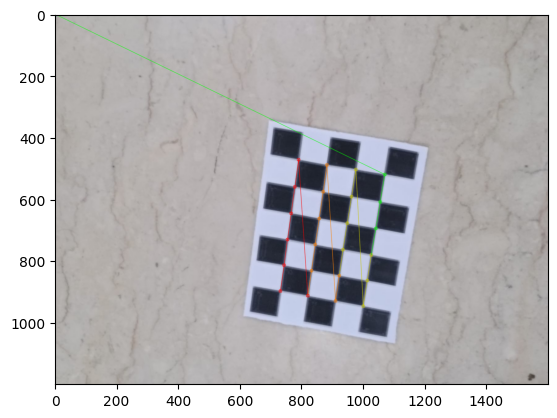

datasets/chessboard/IMG-20240325-WA0034.jpg


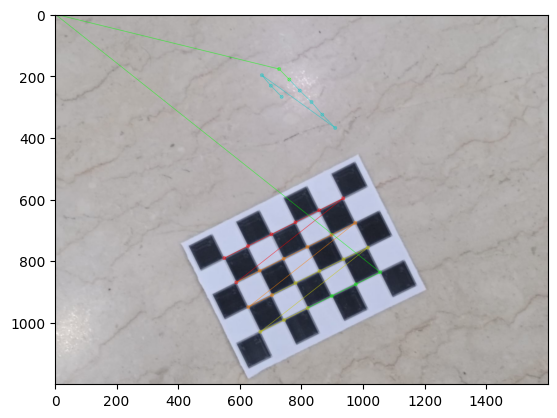

datasets/chessboard/IMG-20240325-WA0035.jpg


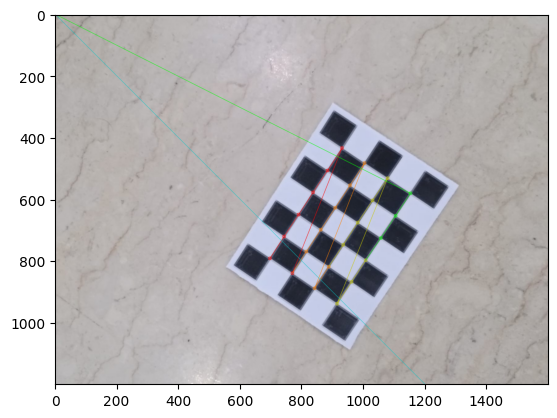

datasets/chessboard/IMG-20240325-WA0036.jpg


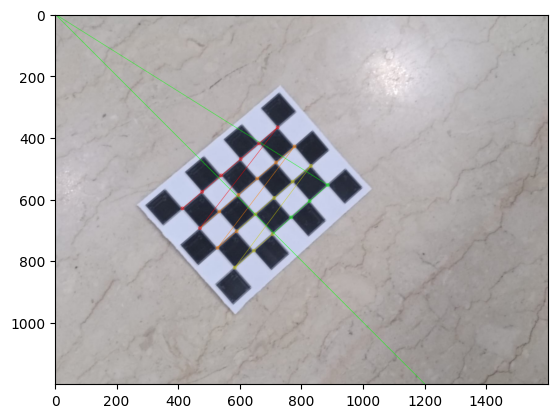

datasets/chessboard/IMG-20240325-WA0037.jpg


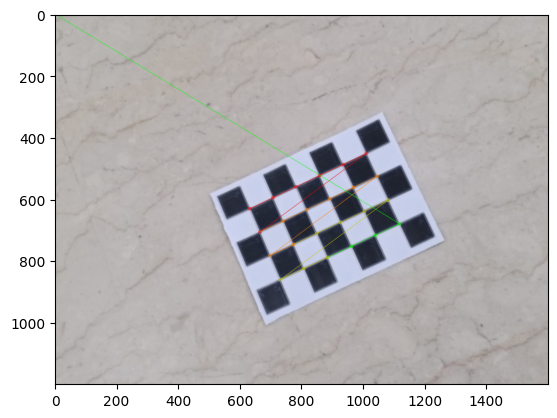

datasets/chessboard/IMG-20240325-WA0038.jpg


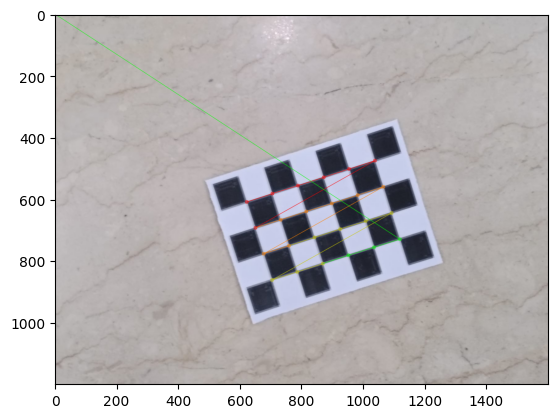

datasets/chessboard/IMG-20240325-WA0039.jpg


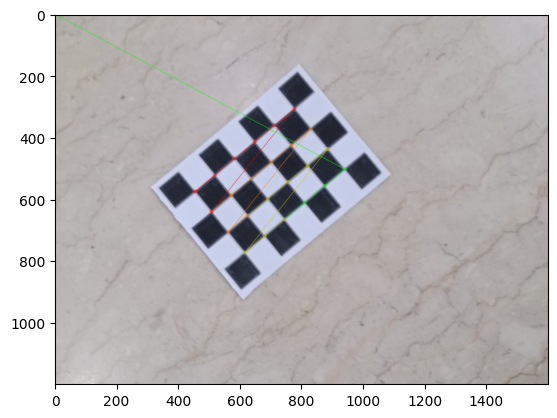

datasets/chessboard/IMG-20240325-WA0040.jpg


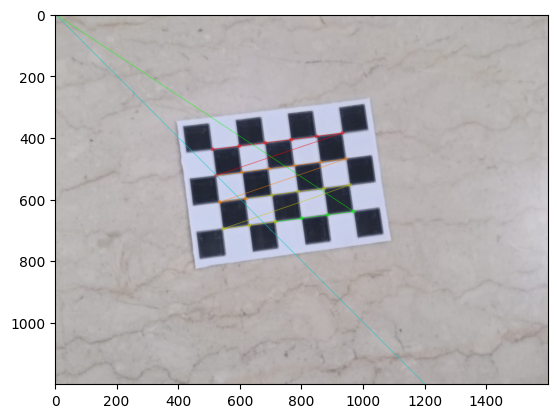

datasets/chessboard/IMG-20240325-WA0041.jpg


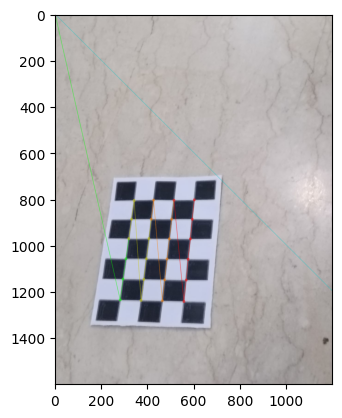

datasets/chessboard/IMG-20240325-WA0042.jpg


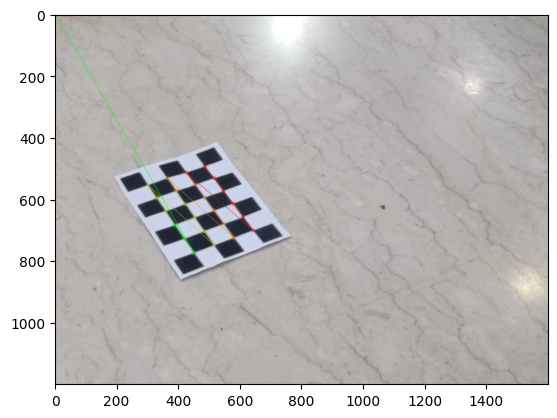

datasets/chessboard/IMG-20240325-WA0043.jpg


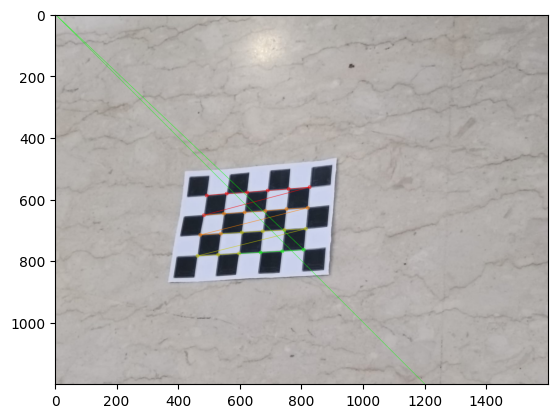

datasets/chessboard/IMG-20240325-WA0044.jpg


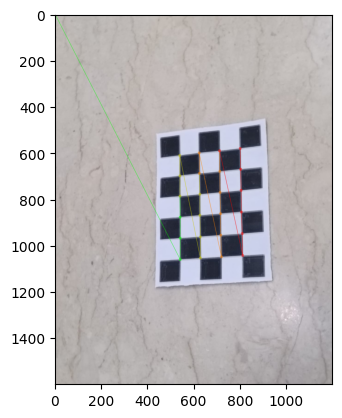

datasets/chessboard/IMG-20240325-WA0045.jpg


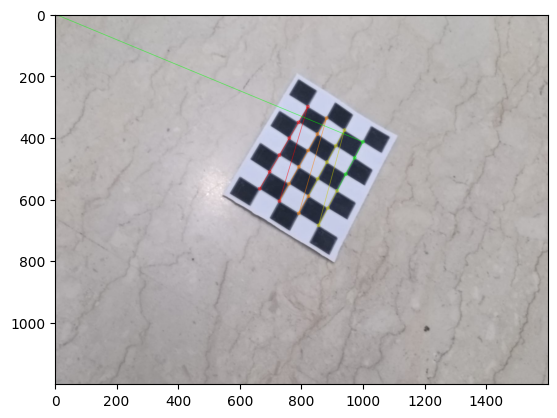

datasets/chessboard/IMG-20240325-WA0046.jpg


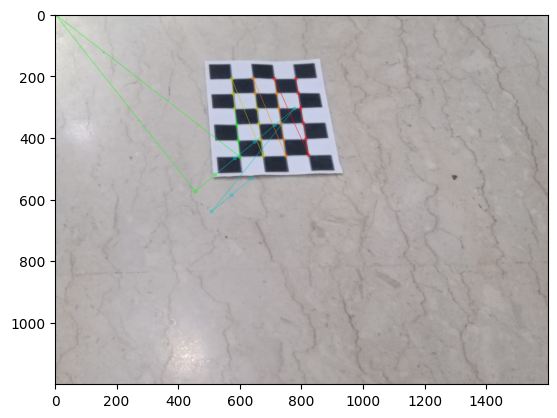

datasets/chessboard/IMG-20240325-WA0047.jpg


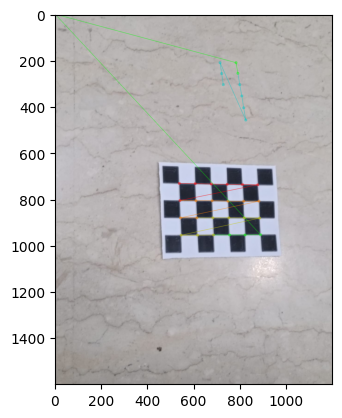

datasets/chessboard/IMG-20240325-WA0048.jpg


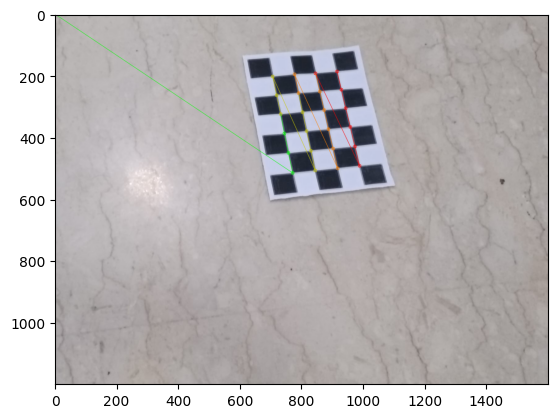

datasets/chessboard/IMG-20240325-WA0049.jpg


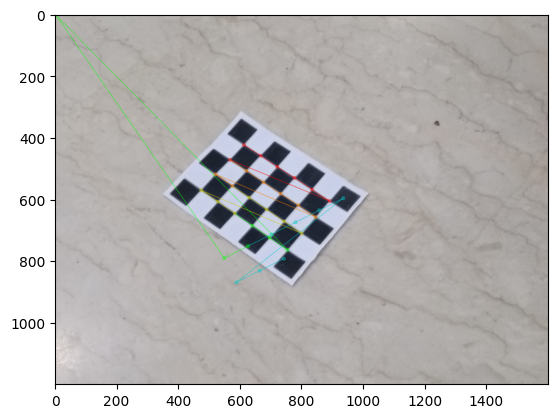

datasets/chessboard/IMG-20240325-WA0050.jpg


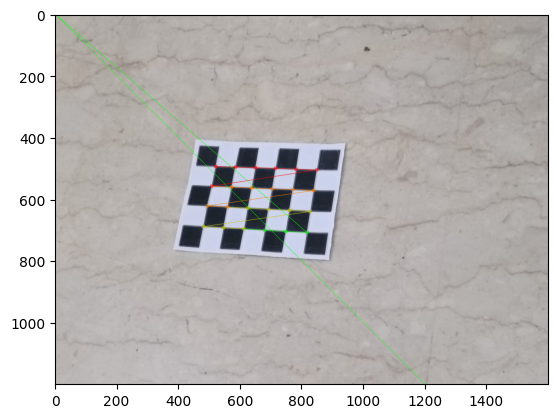

datasets/chessboard/IMG-20240325-WA0051.jpg


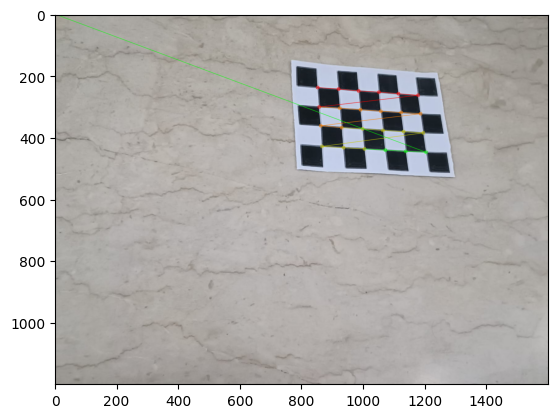

datasets/chessboard/IMG-20240325-WA0052.jpg


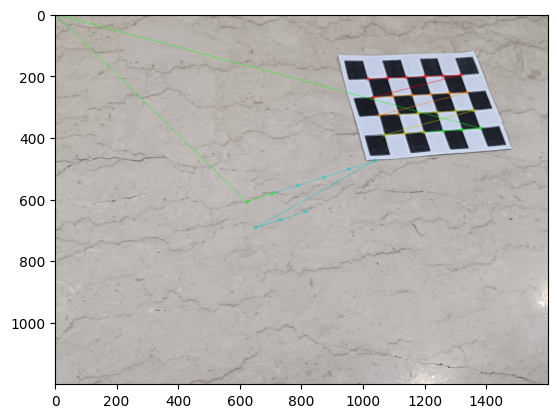

datasets/chessboard/IMG-20240325-WA0053.jpg


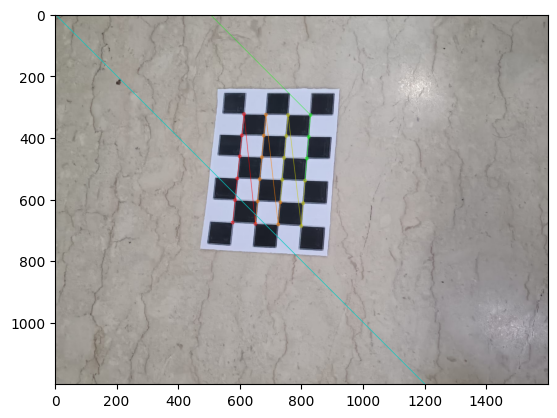

datasets/chessboard/IMG-20240325-WA0054.jpg


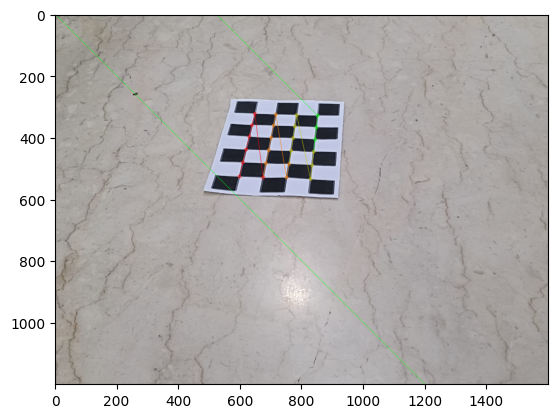

datasets/chessboard/IMG-20240325-WA0055.jpg


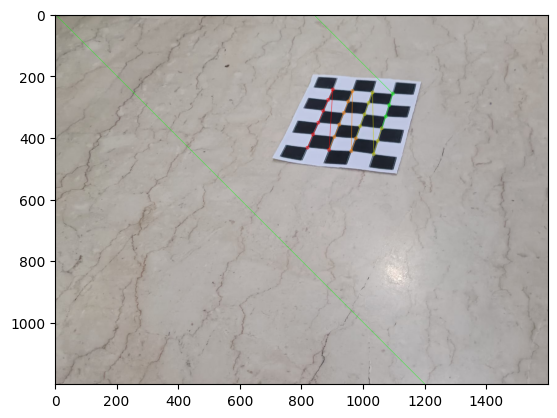

datasets/chessboard/IMG-20240325-WA0056.jpg


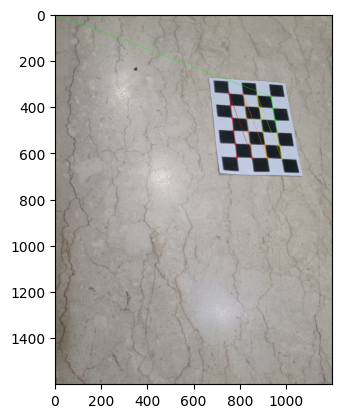

datasets/chessboard/IMG-20240325-WA0057.jpg


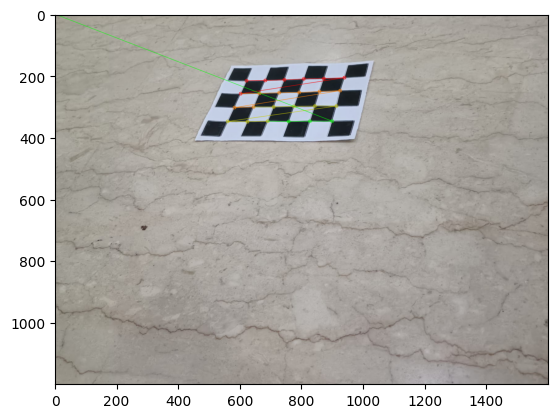

datasets/chessboard/IMG-20240325-WA0058.jpg


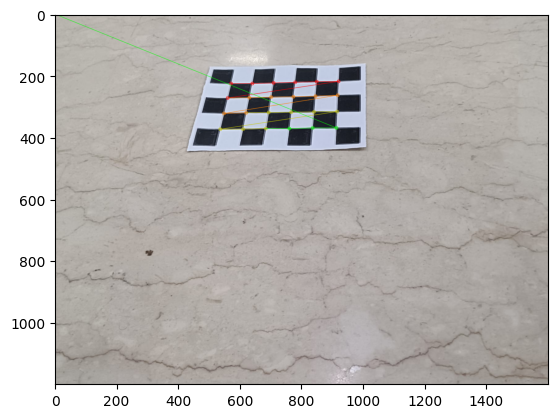

datasets/chessboard/IMG-20240325-WA0059.jpg


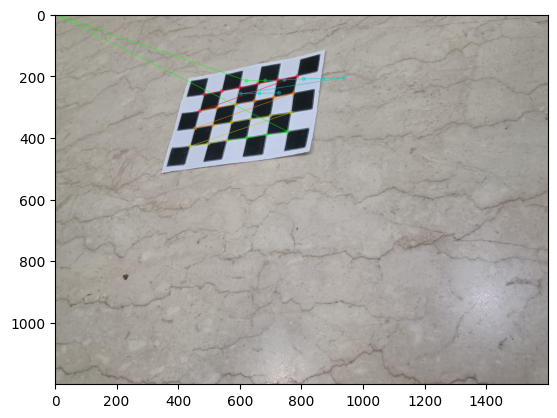

datasets/chessboard/IMG-20240325-WA0060.jpg


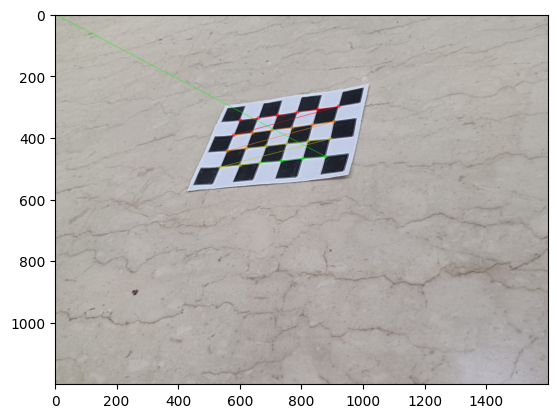

In [14]:
# termination criteria
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)

objp = np.zeros((4*6,3), np.float32)
objp[:,:2] = np.mgrid[0:6,0:4].T.reshape(-1,2)

objpoints = [] # 3d point in real world space
imgpoints = [] # 2d points in image plane.

for image_name in image_names:
    print(image_name)
    img = cv2.imread(image_name)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    ret, corners = cv2.findChessboardCorners(gray, (6,4), None)

    if ret == True:
        objpoints.append(objp)

        corners2 = cv2.cornerSubPix(gray, corners, (11,11), (-1,-1), criteria)
        imgpoints.append(corners2)

        img = cv2.drawChessboardCorners(img, (7,5), corners2, ret)
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.show()

cv2.destroyAllWindows()

# Calibrating the camera
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)

In [17]:
# Extracting the intrinsic parameters

fx = mtx[0, 0]
fy = mtx[1, 1]
cx = mtx[0, 2]
cy = mtx[1, 2]
s = mtx[0, 1]
print("Camera matrix : \n")
print(mtx)
print("fx = ", fx)
print("fy = ", fy)
print("cx = ", cx)
print("cy = ", cy)
print("s = ", s)

Camera matrix : 

[[2.80545944e+03 0.00000000e+00 9.47083412e+02]
 [0.00000000e+00 2.83151822e+03 3.41632201e+02]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]]
fx =  2805.459441074892
fy =  2831.5182220021898
cx =  947.0834123784848
cy =  341.6322005110946
s =  0.0


In [21]:
# Extrinsics parameters for the selected images

for i in range(len(objpoints)):
    rotation_matrix, _ = cv2.Rodrigues(rvecs[i])
    print(f'{image_names[i]}:')
    print('Rotation Matrix:')
    print(rotation_matrix)
    print('Translation Vector:')
    print(tvecs[i])
    print()

datasets/chessboard/IMG-20240325-WA0033.jpg:
Rotation Matrix:
[[ 0.14939378  0.98534503  0.08232053]
 [-0.95594583  0.1652077  -0.24263961]
 [-0.25268372 -0.04244512  0.96661748]]
Translation Vector:
[[-2.41307293]
 [ 6.13897144]
 [30.87485673]]

datasets/chessboard/IMG-20240325-WA0034.jpg:
Rotation Matrix:
[[ 0.89118822  0.44802773  0.07109648]
 [-0.45350291  0.88368473  0.11591551]
 [-0.01089351 -0.135545    0.9907113 ]]
Translation Vector:
[[-4.59670877]
 [ 5.15206066]
 [31.91840931]]

datasets/chessboard/IMG-20240325-WA0035.jpg:
Rotation Matrix:
[[ 0.54492683  0.83304098  0.09538074]
 [-0.83249342  0.55109499 -0.0570001 ]
 [-0.10004727 -0.04834295  0.99380758]]
Translation Vector:
[[-2.90614912]
 [ 5.19056572]
 [32.2680254 ]]

datasets/chessboard/IMG-20240325-WA0036.jpg:
Rotation Matrix:
[[ 0.70509707  0.66509587 -0.24593821]
 [-0.60964807  0.74570788  0.26879172]
 [ 0.36217033 -0.0395885   0.93127085]]
Translation Vector:
[[-6.29300479]
 [ 3.37618168]
 [32.57934564]]

datasets/che

Distortion coefficients: [[ 0.06846814 -2.0937341  -0.01717461  0.01765484  6.28917351]]


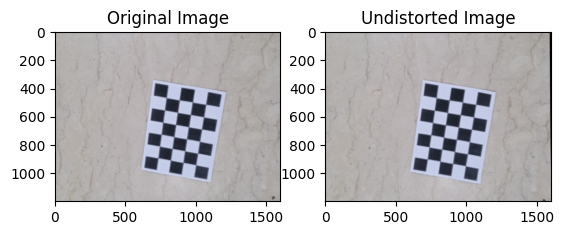

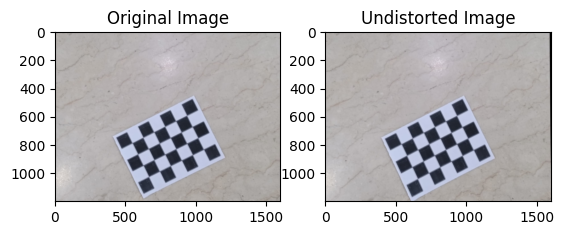

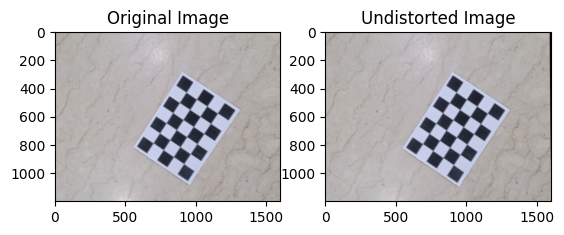

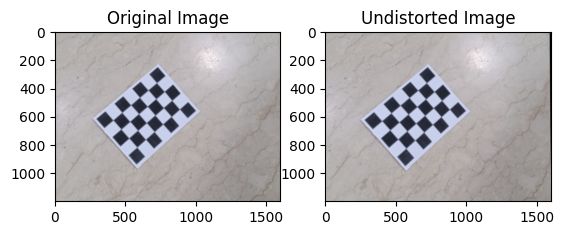

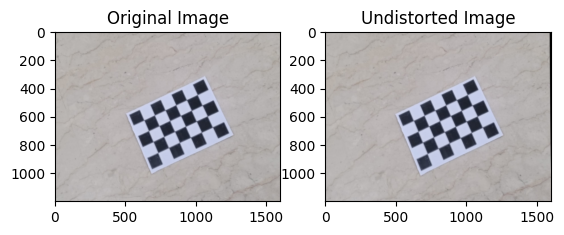

In [24]:
print(f'Distortion coefficients: {dist}')

# Undistorting the first 5 images
for i in range(5):
    img = cv2.imread(image_names[i])
    dst = cv2.undistort(img, mtx, dist, None, mtx)
    # Plot the images side by side
    fig, (ax1, ax2) = plt.subplots(1, 2)
    ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax1.set_title('Original Image')
    ax2.imshow(cv2.cvtColor(dst, cv2.COLOR_BGR2RGB))
    ax2.set_title('Undistorted Image')
    plt.show()

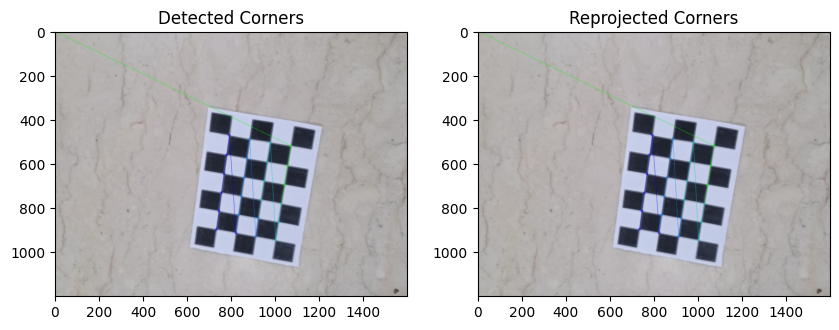

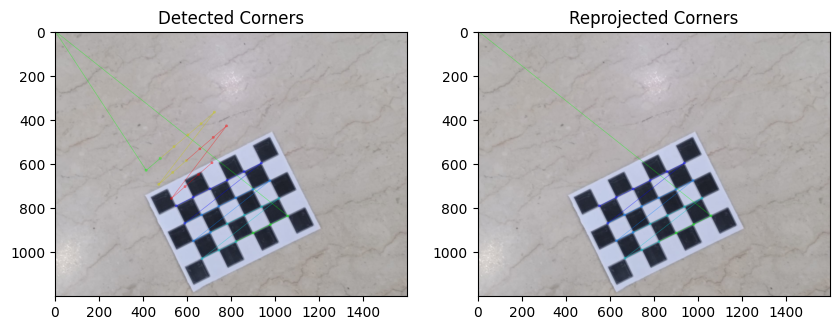

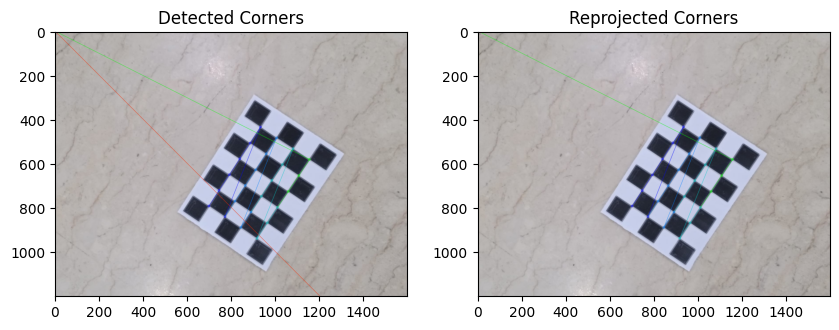

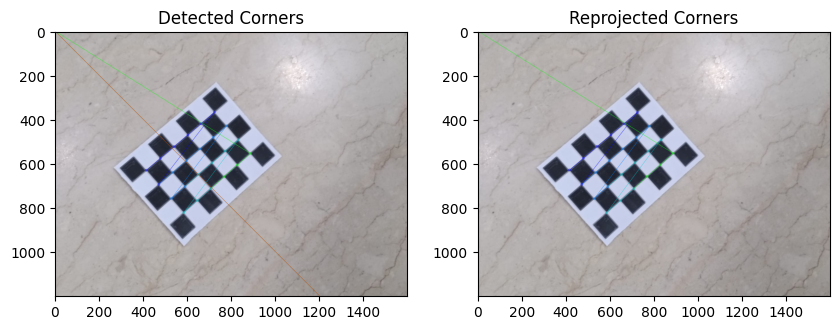

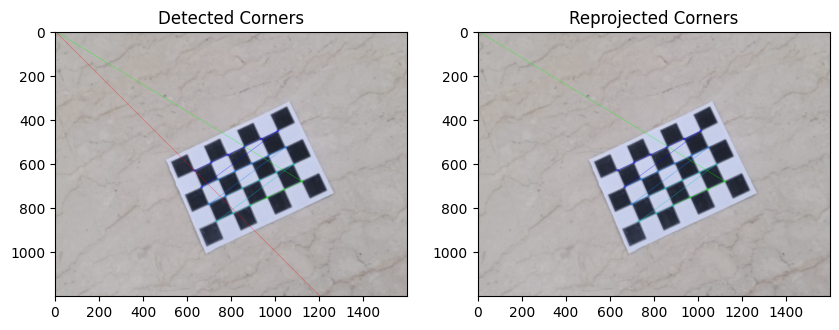

...

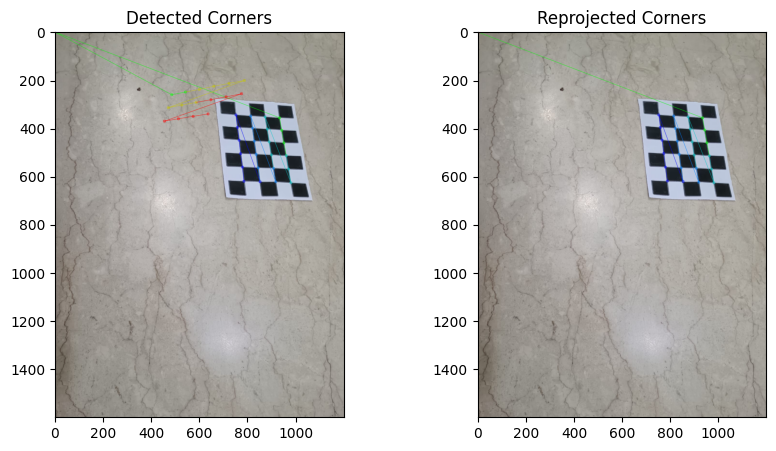

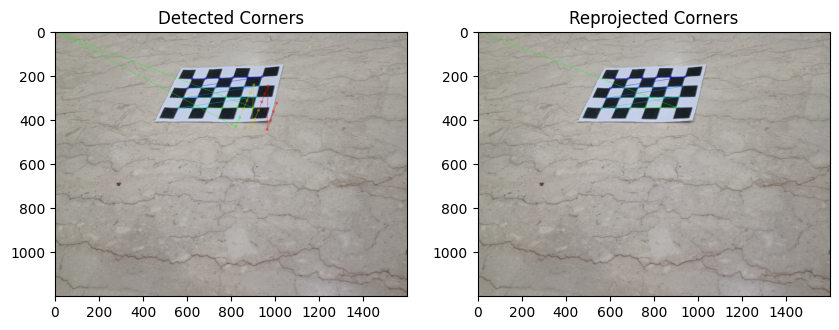

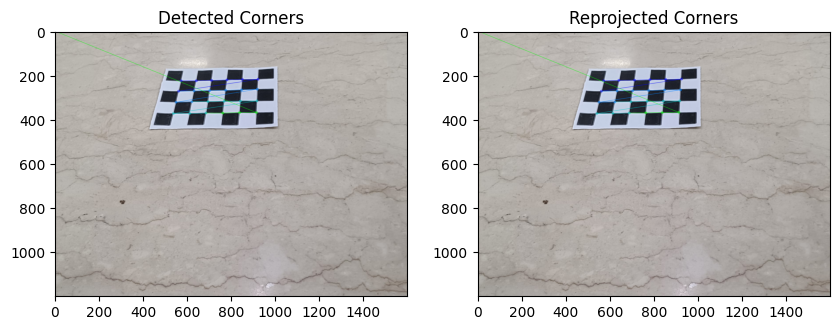

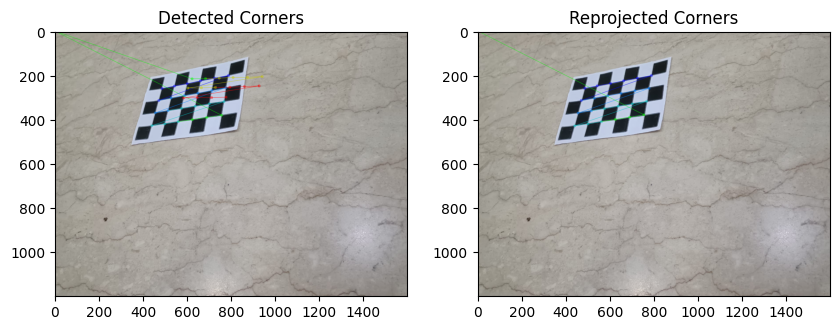

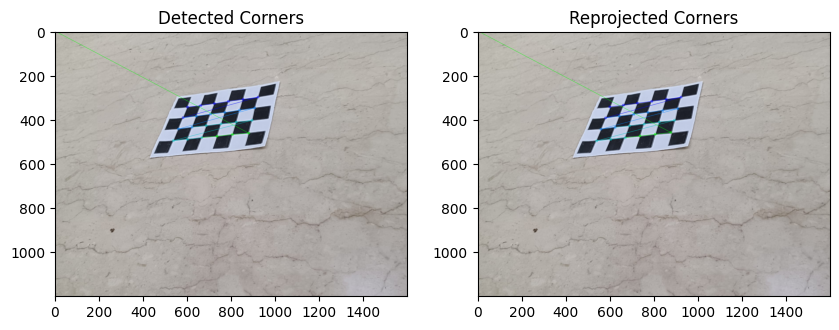

In [26]:
for i in range(len(objpoints)):
    img = cv2.imread(image_names[i])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert to RGB for matplotlib

    # Draw the detected corners
    img_detected = cv2.drawChessboardCorners(img.copy(), (7,6), imgpoints[i], True)

    # Reproject the corners
    imgpoints2, _ = cv2.projectPoints(objpoints[i], rvecs[i], tvecs[i], mtx, dist)
    imgpoints2 = imgpoints2.reshape(-1, 2)
    img_reprojected = cv2.drawChessboardCorners(img.copy(), (7,6), imgpoints2, True)

    # Plot the images
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(img_detected)
    plt.title('Detected Corners')
    plt.subplot(1, 2, 2)
    plt.imshow(img_reprojected)
    plt.title('Reprojected Corners')
    plt.show()

In [27]:
for i in range(len(objpoints)):
    # Convert rotation vectors to rotation matrices
    rotation_matrix, _ = cv2.Rodrigues(rvecs[i])

    # The third column is the normal of the plane
    normal = rotation_matrix[:, 2]

    print(f'{image_names[i]}:')
    print(f'Plane Normal: {normal}')

datasets/chessboard/IMG-20240325-WA0033.jpg:
Plane Normal: [ 0.08232053 -0.24263961  0.96661748]
datasets/chessboard/IMG-20240325-WA0034.jpg:
Plane Normal: [0.07109648 0.11591551 0.9907113 ]
datasets/chessboard/IMG-20240325-WA0035.jpg:
Plane Normal: [ 0.09538074 -0.0570001   0.99380758]
datasets/chessboard/IMG-20240325-WA0036.jpg:
Plane Normal: [-0.24593821  0.26879172  0.93127085]
datasets/chessboard/IMG-20240325-WA0037.jpg:
Plane Normal: [0.13280674 0.26023494 0.95636821]
datasets/chessboard/IMG-20240325-WA0038.jpg:
Plane Normal: [-0.01039767  0.06790537  0.99763758]
datasets/chessboard/IMG-20240325-WA0039.jpg:
Plane Normal: [-0.01261098  0.05770864  0.99825381]
datasets/chessboard/IMG-20240325-WA0040.jpg:
Plane Normal: [-0.10739     0.15302223  0.98237039]
datasets/chessboard/IMG-20240325-WA0041.jpg:
Plane Normal: [0.13359794 0.58847445 0.79740166]
datasets/chessboard/IMG-20240325-WA0042.jpg:
Plane Normal: [-0.07901364  0.79477428  0.60173972]
datasets/chessboard/IMG-20240325-WA0043